Data: https://www.kaggle.com/hmavrodiev/london-bike-sharing-dataset


### Steps when conducting time series work 

1. Plot the data
2. Things to think about. 



- Do you need to add in caps 
- Is the time series additive or multiplicative?  
- Is there seasonality?
- Do you need to add in holidays? 
- Do you need to add in change points?
- Do you need to add additional regressors?
- Should you add Bayes sampling?



5. Split the data into train and test 
6. Baseline model 
7. Advanced model 
8. Use best model to predict future data

In [603]:
import os
import pandas as pd
import numpy as np
import random
from time import time

import matplotlib.pyplot as plt
%matplotlib inline
# set plot style
plt.style.use('ggplot')

from fbprophet import Prophet
from fbprophet.plot import add_changepoints_to_plot
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [572]:
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


def calculate_forecast_errors(df, prediction_size):

    test_df = df[-prediction_size:]
    y_true, y_pred = np.array(test_df['y']), np.array(test_df['yhat'])
    
    return {'MAPE': round(mean_absolute_percentage_error(y_true, y_pred), 3),
            'MAE': round(mean_absolute_error(y_true, y_pred),3),
            'MSE': round(mean_squared_error(y_true, y_pred),3)}

In [573]:
path = '/Users/Paresh.Sharma@ibm.com/Paresh/Data_Science/Datasets/Tfl bike data'
os.chdir(path)

In [574]:
df = pd.read_csv('london_merged.csv')
print(df.shape)
df.head()

(17414, 10)


,timestamp,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0
2,2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0
3,2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0
4,2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0


### Data cleaning 

In [575]:
# check for null values 
df.isnull().sum()

timestamp       0
cnt             0
t1              0
t2              0
hum             0
wind_speed      0
weather_code    0
is_holiday      0
is_weekend      0
season          0
dtype: int64

In [576]:
# check if statistics make sense e.g. avergages, negative values etc
df.describe()

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season
count,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000
mean,1143.101642,12.468091,11.520836,72.324954,15.913063,2.722752,0.022051,0.285403,1.492075
std,1085.108068,5.571818,6.615145,14.313186,7.894570,2.341163,0.146854,0.451619,1.118911
min,0.000000,-1.500000,-6.000000,20.500000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,257.000000,8.000000,6.000000,63.000000,10.000000,1.000000,0.000000,0.000000,0.000000
50%,844.000000,12.500000,12.500000,74.500000,15.000000,2.000000,0.000000,0.000000,1.000000
75%,1671.750000,16.000000,16.000000,83.000000,20.500000,3.000000,0.000000,1.000000,2.000000
max,7860.000000,34.000000,34.000000,100.000000,56.500000,26.000000,1.000000,1.000000,3.000000


### Data visualisation 

In [577]:
df.set_index('timestamp', inplace=True)

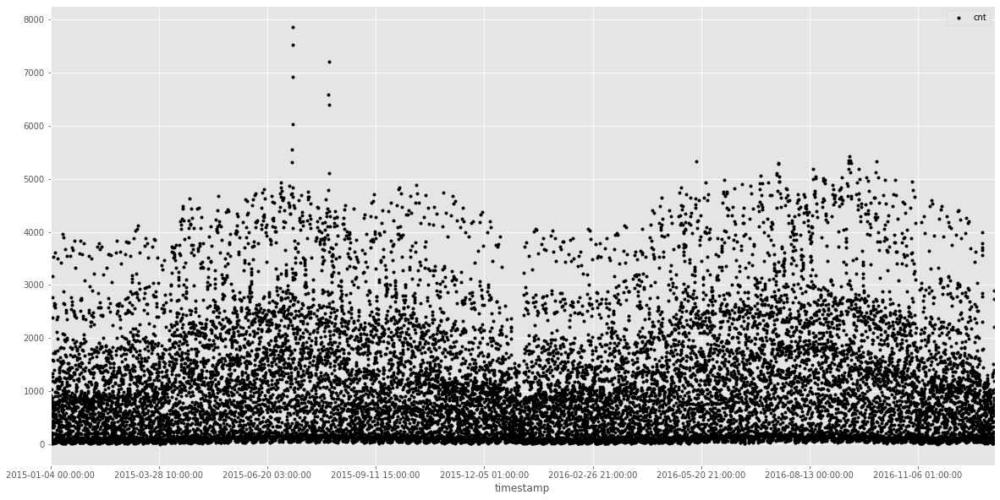

In [578]:
df['cnt'].plot(figsize=(20, 10), style='k.', legend = True);

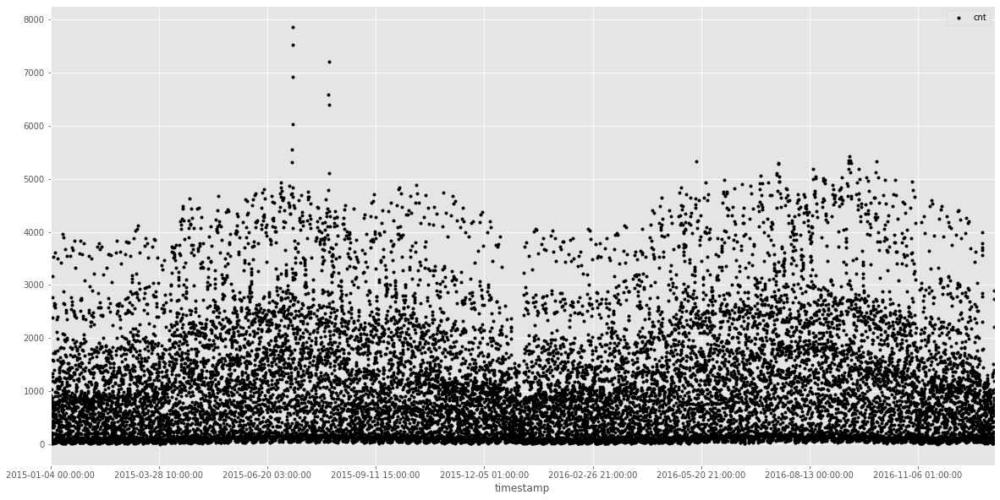

In [579]:
df['cnt'].plot(figsize=(20, 10), style='k.', legend = True);

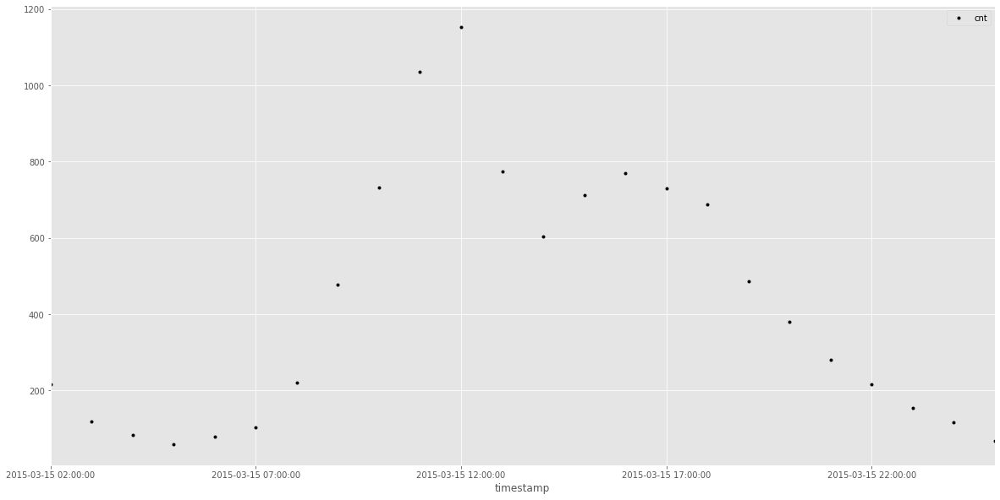

In [580]:
# observe daily trends 
df['cnt'][24*70:24*71].plot(figsize=(20, 10), style='k.', legend = True);

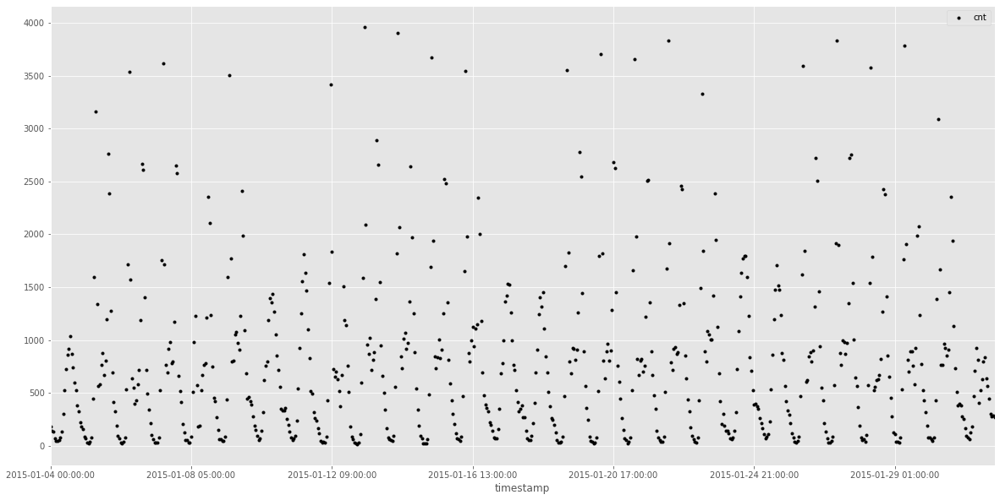

In [581]:
# observe weekly trends 
df['cnt'][0:24*7*4].plot(figsize=(20, 10), style='k.', legend = True);

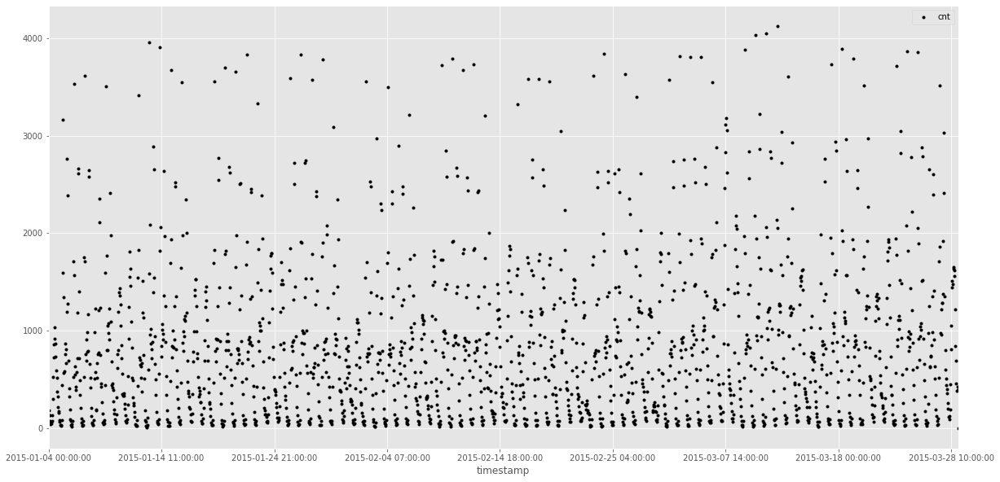

In [582]:
# observe monthly trends 
df['cnt'][0:24*7*12].plot(figsize=(20, 10), style='k.', legend = True);

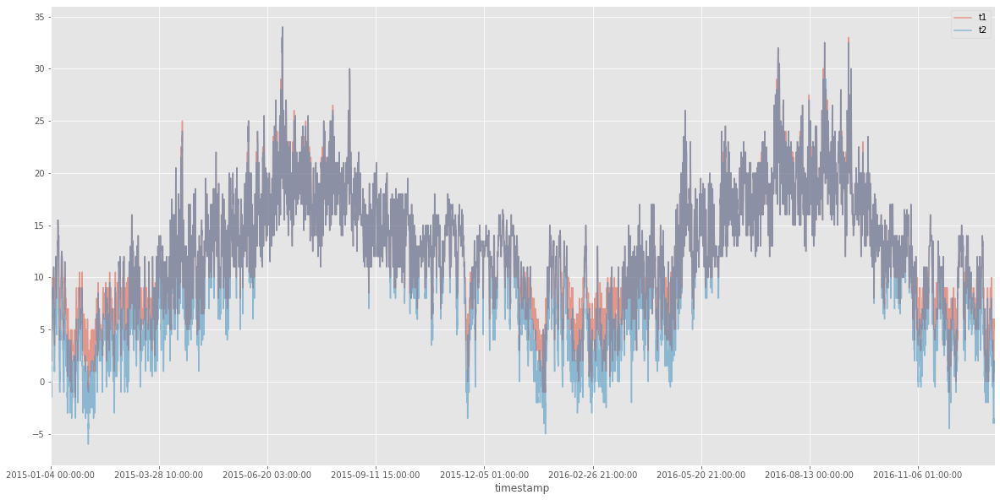

In [583]:
df[['t1', 't2']].plot(figsize=(20, 10), alpha = 0.5, legend = True);

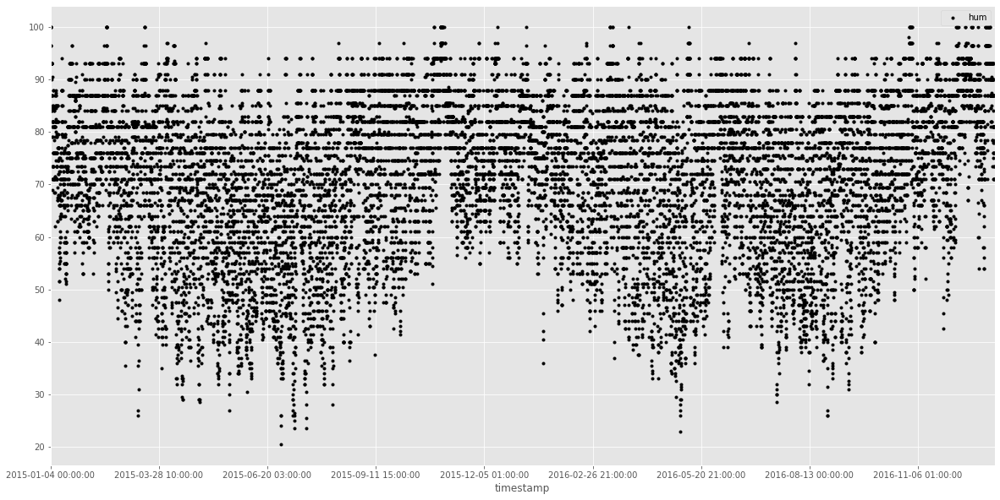

In [584]:
df['hum'].plot(figsize=(20, 10), style='k.', legend = True);

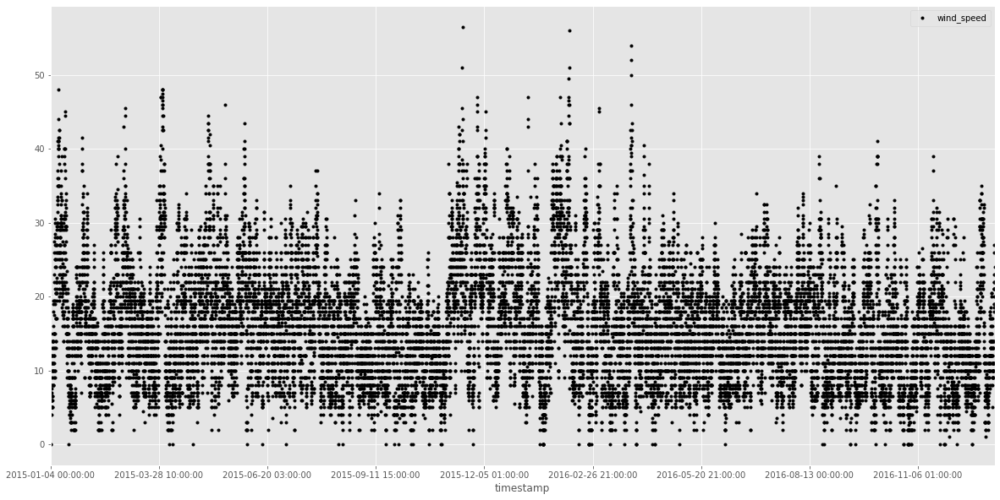

In [585]:
df['wind_speed'].plot(figsize=(20, 10), style='k.', legend = True);

### Create training data

In [586]:
# format the df to use in Prophet 
df.reset_index(inplace=True)
df.rename(columns={'timestamp': 'ds', 'cnt': 'y'}, inplace=True)
df['ds'] = df['ds'].astype('datetime64[ns]')

df['floor'] = 0 # creates a lower bound for predicted values
df['cap'] = 15000 # creates an upper bound for predicted values
df.head()

,ds,y,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season,floor,cap
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0,0,15000
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0,0,15000
2,2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0,0,15000
3,2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0,0,15000
4,2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0,0,15000


In [587]:
# create training data
prediction_size = 50
train_df = df[:-prediction_size]

### Baseline model 

In [547]:
# create a prophet object and call it's fit method and pass in the historical df
m = Prophet(growth='logistic', yearly_seasonality=False, weekly_seasonality=False, daily_seasonality=False)
m.fit(train_df)

# create a df with past and future hourly periods
future = m.make_future_dataframe(periods=prediction_size, freq = 'H')
future['floor'] = 0
future['cap'] = 15000

In [548]:
# forecast values
forecast = m.predict(future)
forecast.tail()

,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
17409,2017-01-03 19:00:00,1022.215764,15000,0,-318.097036,2415.995670,1022.215764,1022.215764,0.0,0.0,0.0,0.0,0.0,0.0,1022.215764
17410,2017-01-03 20:00:00,1022.125495,15000,0,-297.778533,2410.962309,1022.125495,1022.125495,0.0,0.0,0.0,0.0,0.0,0.0,1022.125495
17411,2017-01-03 21:00:00,1022.035232,15000,0,-401.511582,2361.266421,1022.035232,1022.035232,0.0,0.0,0.0,0.0,0.0,0.0,1022.035232
17412,2017-01-03 22:00:00,1021.944977,15000,0,-389.383929,2442.681149,1021.944977,1021.944977,0.0,0.0,0.0,0.0,0.0,0.0,1021.944977
17413,2017-01-03 23:00:00,1021.854729,15000,0,-326.843644,2550.582660,1021.854729,1021.854729,0.0,0.0,0.0,0.0,0.0,0.0,1021.854729


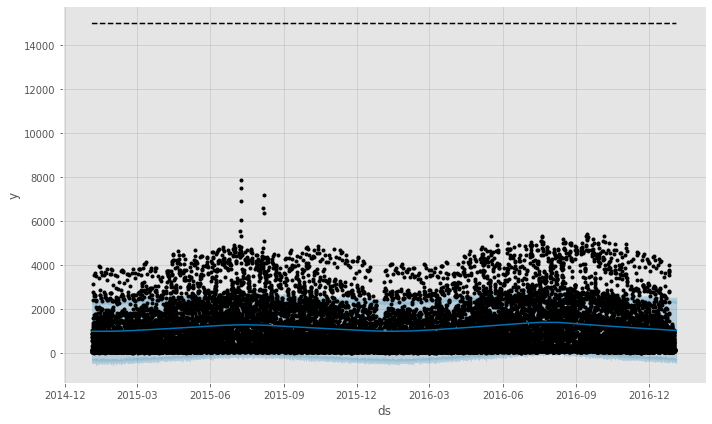

In [549]:
m.plot(forecast);

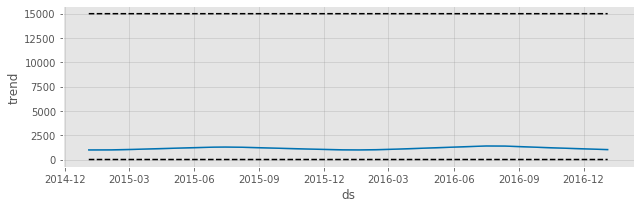

In [550]:
m.plot_components(forecast);

In [551]:
# create a df with y and yhat values 
cmp_df = pd.merge(forecast, df, on='ds', how='outer')[['ds','yhat', 'yhat_lower','yhat_upper', 'y']].set_index('ds')

In [552]:
# look at y and yhat values on predicted data
test_df = cmp_df[-prediction_size:]
y_true, y_pred = np.array(test_df['y']), np.array(test_df['yhat'])

y_true, y_pred

(array([ 119,   89,   84,   62,   41,   23,   18,   35,   64,  111,  203,
         411,  668, 1021, 1267, 1316, 1520, 1350,  971,  718,  594,  433,
         334,  233,  201,  145,   63,   49,   43,   10,   30,   83,  434,
        1407, 2904, 1357,  661,  636,  825,  878,  765,  845, 1201, 2742,
        2220, 1042,  541,  337,  224,  139]),
 array([1026.28556368, 1026.19496081, 1026.10436535, 1026.01377729,
        1025.92319665, 1025.83262342, 1025.7420576 , 1025.65149919,
        1025.56094819, 1025.47040459, 1025.3798684 , 1025.28933962,
        1025.19881824, 1025.10830427, 1025.0177977 , 1024.92729854,
        1024.83680679, 1024.74632244, 1024.65584549, 1024.56537594,
        1024.4749138 , 1024.38445905, 1024.29401171, 1024.20357177,
        1024.11313923, 1024.02271409, 1023.93229635, 1023.84188601,
        1023.75148306, 1023.66108751, 1023.57069936, 1023.48031861,
        1023.38994526, 1023.29957929, 1023.20922073, 1023.11886956,
        1023.02852578, 1022.9381894 , 1022.847

In [553]:
# print MAPE, MAE and MSE
for err_name, err_value in calculate_forecast_errors(cmp_df, prediction_size).items():
                          print(err_name, err_value) 

MAPE 935.851
MAE 677.426
MSE 619395.367


In [566]:
cross_validation_results = cross_validation(m, initial='100 days', period='25 days', horizon='100 days')
print(cross_validation_results)

performance_metrics_results = performance_metrics(cross_validation_results)
print(performance_metrics_results)

INFO:fbprophet:Making 22 forecasts with cutoffs between 2015-04-17 21:00:00 and 2016-09-23 21:00:00


                       ds         yhat  yhat_lower   yhat_upper    y  \
0     2015-04-17 22:00:00  1150.805032   59.698435  2174.441245  594   
1     2015-04-17 23:00:00  1151.036669    4.846645  2341.297480  482   
2     2015-04-18 00:00:00  1151.268348   47.481013  2214.085023  332   
3     2015-04-18 01:00:00  1151.500070  -48.527134  2276.053400  267   
4     2015-04-18 02:00:00  1151.731835   30.286708  2151.369921  193   
...                   ...          ...         ...          ...  ...   
52315 2017-01-01 17:00:00  2126.563328  731.253950  3438.256652  151   
52316 2017-01-01 18:00:00  2126.775878  688.260907  3490.955696  140   
52317 2017-01-01 19:00:00  2126.988446  749.291047  3421.156832  136   
52318 2017-01-01 20:00:00  2127.201031  757.126879  3530.396865  116   
52319 2017-01-01 21:00:00  2127.413634  792.344615  3489.140851  110   

                   cutoff  
0     2015-04-17 21:00:00  
1     2015-04-17 21:00:00  
2     2015-04-17 21:00:00  
3     2015-04-17 21:00:

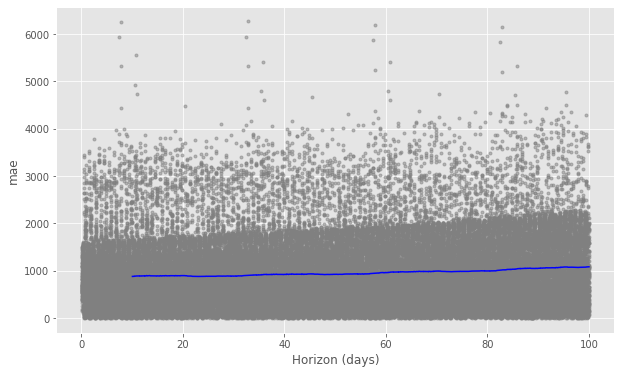

In [567]:
fig = plot_cross_validation_metric(cross_validation_results, metric='mae')

### Advanced model 

In [463]:
df.head()

,ds,y,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season,floor,cap
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0,0,15000
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0,0,15000
2,2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0,0,15000
3,2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0,0,15000
4,2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0,0,15000


In [522]:
# create a prophet object and call it's fit method and pass in the historical df
m = Prophet(growth='logistic', changepoint_prior_scale=20, seasonality_prior_scale=20, holidays_prior_scale=40,\
            mcmc_samples=0, seasonality_mode='multiplicative', yearly_seasonality=False, weekly_seasonality=False, 
            daily_seasonality=False)


# add seasonality
m.add_seasonality(name='daily', period=1, fourier_order=30, prior_scale=30)
m.add_seasonality(name='weekly', period=7, fourier_order=5, prior_scale=5)
m.add_seasonality(name='yearly',period=365.25, fourier_order=5, prior_scale=5)
m.add_seasonality(name='monthly', period=365.25/12,fourier_order=5, prior_scale=5)

# add holidays 
m.add_country_holidays(country_name='England')

# add regressors 
m.add_regressor('season')

# fit model
m.fit(train_df)

# create a df with past and future hourly periods
future = m.make_future_dataframe(periods=prediction_size, freq = 'H')
future['season'] = df['season']
future['floor'] = 0
future['cap'] = 10000

In [523]:
# forecast values
forecast = m.predict(future)
forecast.tail()

,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,Boxing Day,Boxing Day_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
17409,2017-01-03 19:00:00,203.333146,10000,0,92.232950,1559.412324,203.333146,203.333146,0.0,0.0,...,0.246786,0.246786,0.246786,-0.096402,-0.096402,-0.096402,0.0,0.0,0.0,830.010056
17410,2017-01-03 20:00:00,203.292868,10000,0,-226.396950,1302.417983,203.292868,203.292868,0.0,0.0,...,0.236773,0.236773,0.236773,-0.096557,-0.096557,-0.096557,0.0,0.0,0.0,540.270660
17411,2017-01-03 21:00:00,203.252598,10000,0,-378.393165,1165.673648,203.252598,203.252598,0.0,0.0,...,0.224828,0.224828,0.224828,-0.096712,-0.096712,-0.096712,0.0,0.0,0.0,380.591815
17412,2017-01-03 22:00:00,203.212336,10000,0,-421.958691,1089.472387,203.212336,203.212336,0.0,0.0,...,0.211458,0.211458,0.211458,-0.096866,-0.096866,-0.096866,0.0,0.0,0.0,303.814376
17413,2017-01-03 23:00:00,203.172082,10000,0,-556.744526,974.715248,203.172082,203.172082,0.0,0.0,...,0.197215,0.197215,0.197215,-0.097019,-0.097019,-0.097019,0.0,0.0,0.0,225.990205


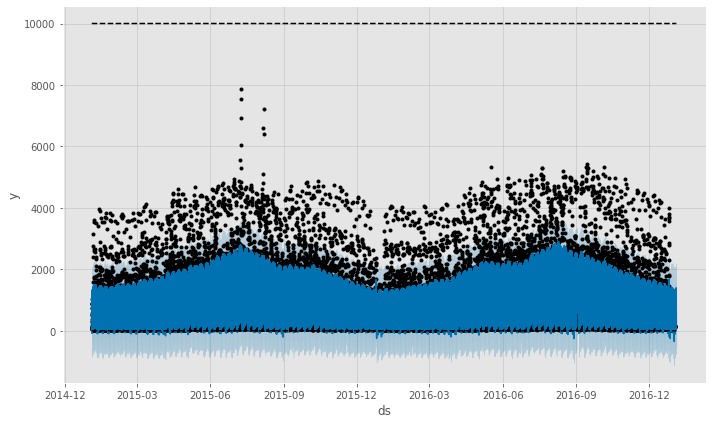

In [524]:
m.plot(forecast);

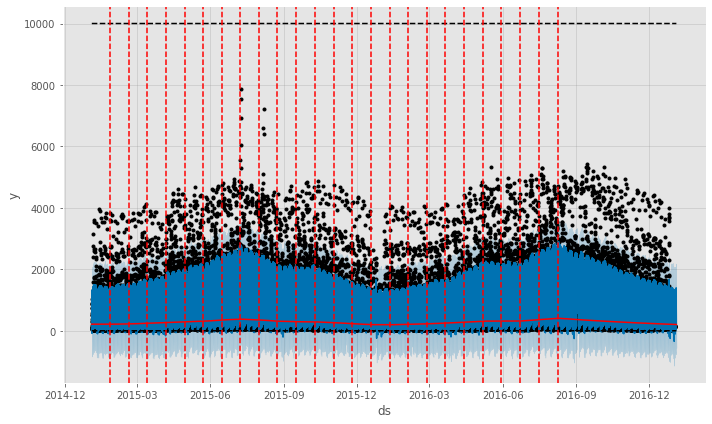

In [525]:
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

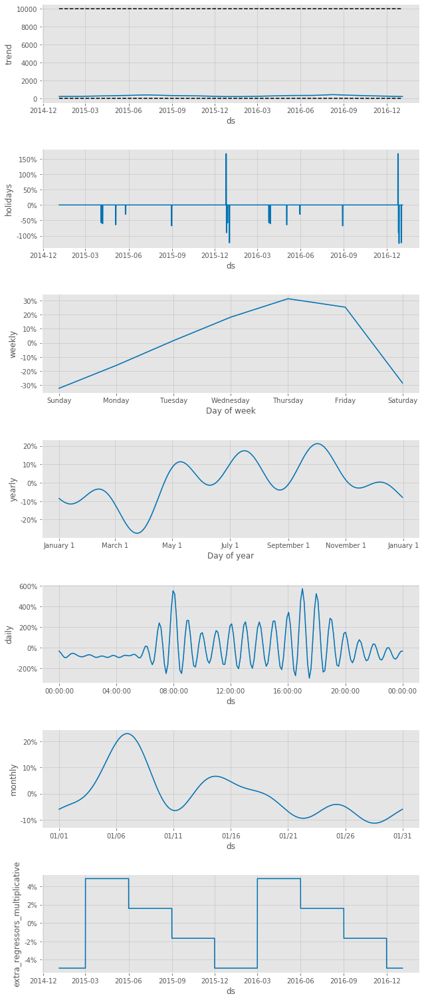

In [526]:
m.plot_components(forecast);

In [527]:
# create a df with y and yhat values 
cmp_df = pd.merge(forecast, df, on='ds', how='outer')[['ds','yhat', 'yhat_lower','yhat_upper', 'y']].set_index('ds')

In [528]:
test_df = cmp_df[-prediction_size:]
y_true, y_pred = np.array(test_df['y']), np.array(test_df['yhat'])

y_true, y_pred

(array([ 119,   89,   84,   62,   41,   23,   18,   35,   64,  111,  203,
         411,  668, 1021, 1267, 1316, 1520, 1350,  971,  718,  594,  433,
         334,  233,  201,  145,   63,   49,   43,   10,   30,   83,  434,
        1407, 2904, 1357,  661,  636,  825,  878,  765,  845, 1201, 2742,
        2220, 1042,  541,  337,  224,  139]),
 array([ -47.0431762 , -115.82280133,   68.8129861 ,   30.86500558,
           5.05134781,   -9.70272696,  -14.91102231,    7.47218713,
         182.76680932,  665.00227543, 1334.59369147,  752.67708684,
         477.65255144,  522.3867973 ,  659.21677893,  695.64701105,
         681.33268916,  727.8442948 ,  876.63624731, 1341.63014678,
        1248.70187492,  773.83411437,  484.52898087,  326.7942903 ,
         253.18585881,  179.26373842,  108.03387697,   66.52000284,
          38.05170005,   21.59764244,   15.65115975,   38.13476958,
         213.70089701,  695.54310852, 1364.51050246,  788.40770978,
         518.07134526,  566.12481674,  705.799

In [529]:
# print MAPE, MAE and MSE
for err_name, err_value in calculate_forecast_errors(cmp_df, prediction_size).items():
                          print(err_name, err_value) 

MAPE 75.99
MAE 296.101
MSE 220000.697


In [ ]:
cross_validation_results = cross_validation(m, initial='100 days', period='1 days', horizon='100 days')
print(cross_validation_results)

performance_metrics_results = performance_metrics(cross_validation_results)
print(performance_metrics_results)

In [ ]:
fig = plot_cross_validation_metric(cross_validation_results, metric='mae')

### Hyperparameter tuning the model 

#### Random grid search

In [602]:
def prophetrandomgridsearch(df, train_df, param_grid, n_iter):

    results_df = pd.DataFrame(columns=['MAPE', 'MAE', 'MSE', 'params'])
    
    count = 0 
    while count!=n_iter:

        growth = random.choice(param_grid['growth'])
        changepoint_prior_scale = random.choice(param_grid['changepoint_prior_scale'])
        seasonality_prior_scale = random.choice(param_grid['seasonality_prior_scale'])
        holidays_prior_scale = random.choice(param_grid['holidays_prior_scale'])


        params = {'growth': growth, 'changepoint_prior_scale': changepoint_prior_scale,
                      'seasonality_prior_scale': seasonality_prior_scale, 'holidays_prior_scale': holidays_prior_scale}


        # create a prophet object and call it's fit method and pass in the historical df
        m = Prophet(growth=growth, changepoint_prior_scale=changepoint_prior_scale, 
                    seasonality_prior_scale=seasonality_prior_scale,
                    holidays_prior_scale=holidays_prior_scale,
                    mcmc_samples=0, seasonality_mode='multiplicative', yearly_seasonality=False, weekly_seasonality=False, 
                    daily_seasonality=False)

        # add seasonality
        m.add_seasonality(name='daily', period=1, fourier_order=30, prior_scale=30)
        m.add_seasonality(name='weekly', period=7, fourier_order=5, prior_scale=5)
        m.add_seasonality(name='yearly',period=365.25, fourier_order=5, prior_scale=5)
        m.add_seasonality(name='monthly', period=365.25/12,fourier_order=5, prior_scale=5)

        # add holidays 
        m.add_country_holidays(country_name='England')

        # add regressors 
        m.add_regressor('season')

        # fit model
        m.fit(train_df)

        # create a df with past and future hourly periods
        future = m.make_future_dataframe(periods=prediction_size, freq = 'H')
        future['season'] = df['season']
        future['floor'] = 0
        future['cap'] = 10000

        # forecast values
        forecast = m.predict(future)

        # create a df with y and yhat values 
        cmp_df = pd.merge(forecast, df, on='ds', how='outer')[['ds','yhat', 'yhat_lower','yhat_upper', 'y']].set_index('ds')

        ls = []

        # print MAPE, MAE and MSE
        for err_name, err_value in calculate_forecast_errors(cmp_df, prediction_size).items():
                                  ls.append(err_value)


        ls.append(params)
        results_df.loc[len(results_df)] = ls
        count+=1
    
    
    return results_df

In [604]:
# define hyperparamters
param_grid = {'growth': ['linear', 'logistic'], 'changepoint_prior_scale': [5, 10, 20],
              'seasonality_prior_scale': [5,10,20], 'holidays_prior_scale': [5,10,20,30,40]}

In [605]:
start = time()
results_df = prophetrandomgridsearch(df, train_df, param_grid, 15)
end = time()

print('Total time:' + str(end-start))

In [606]:
results_df

,MAPE,MAE,MSE,params
0,82.694,296.675,218081.664,"{'growth': 'logistic', 'changepoint_prior_scal..."
1,78.248,295.380,217970.164,"{'growth': 'logistic', 'changepoint_prior_scal..."
2,78.248,295.380,217970.164,"{'growth': 'logistic', 'changepoint_prior_scal..."
3,118.746,311.131,214091.755,"{'growth': 'linear', 'changepoint_prior_scale'..."
4,78.549,298.773,221450.668,"{'growth': 'logistic', 'changepoint_prior_scal..."
5,118.786,311.111,213788.543,"{'growth': 'linear', 'changepoint_prior_scale'..."
6,77.395,297.602,220918.335,"{'growth': 'logistic', 'changepoint_prior_scal..."
7,75.967,295.480,219329.648,"{'growth': 'logistic', 'changepoint_prior_scal..."
8,120.003,311.141,213501.214,"{'growth': 'linear', 'changepoint_prior_scale'..."
9,116.002,308.718,211995.965,"{'growth': 'linear', 'changepoint_prior_scale'..."


In [631]:
results_df['params'][7]

{'growth': 'logistic',
 'changepoint_prior_scale': 5,
 'seasonality_prior_scale': 5,
 'holidays_prior_scale': 40}

#### Grid search 

In [624]:
def prophetgridsearch(df, train_df, param_grid):

    results_df = pd.DataFrame(columns=['MAPE', 'MAE', 'MSE', 'params'])
    
    for g in param_grid['growth']:
        for c in param_grid['changepoint_prior_scale']:
            for s in param_grid['seasonality_prior_scale']:
                for h in param_grid['holidays_prior_scale']:

                    params = {'growth': g, 'changepoint_prior_scale': c,
                          'seasonality_prior_scale': s, 'holidays_prior_scale': h}

                    # create a prophet object and call it's fit method and pass in the historical df
                    m = Prophet(growth=g, changepoint_prior_scale=c, 
                                seasonality_prior_scale=s,
                                holidays_prior_scale=h,
                                mcmc_samples=0, seasonality_mode='multiplicative', yearly_seasonality=False, weekly_seasonality=False, 
                                daily_seasonality=False)

                    # add seasonality
                    m.add_seasonality(name='daily', period=1, fourier_order=30, prior_scale=30)
                    m.add_seasonality(name='weekly', period=7, fourier_order=5, prior_scale=5)
                    m.add_seasonality(name='yearly',period=365.25, fourier_order=5, prior_scale=5)
                    m.add_seasonality(name='monthly', period=365.25/12,fourier_order=5, prior_scale=5)

                    # add holidays 
                    m.add_country_holidays(country_name='England')

                    # add regressors 
                    m.add_regressor('season')

                    # fit model
                    m.fit(train_df)

                    # create a df with past and future hourly periods
                    future = m.make_future_dataframe(periods=prediction_size, freq = 'H')
                    future['season'] = df['season']
                    future['floor'] = 0
                    future['cap'] = 10000

                    # forecast values
                    forecast = m.predict(future)

                    # create a df with y and yhat values 
                    cmp_df = pd.merge(forecast, df, on='ds', how='outer')[['ds','yhat', 'yhat_lower','yhat_upper', 'y']].set_index('ds')

                    ls = []

                    # print MAPE, MAE and MSE
                    for err_name, err_value in calculate_forecast_errors(cmp_df, prediction_size).items():
                                              ls.append(err_value)


                    ls.append(params)
                    results_df.loc[len(results_df)] = ls
    
    return results_df

In [625]:
# define hyperparamters
param_grid = {'growth': ['linear','logistic'], 'changepoint_prior_scale': [5, 30],
              'seasonality_prior_scale': [5,30], 'holidays_prior_scale': [30,40,50,60]}

In [627]:
start = time()
final_results_df = prophetgridsearch(df, train_df, param_grid)
end = time()

print('Total time:' + str(end-start))  

Total time:2101.0331168174744


In [628]:
final_results_df

,MAPE,MAE,MSE,params
0,117.060,309.856,213100.461,"{'growth': 'linear', 'changepoint_prior_scale'..."
1,110.736,305.723,210842.150,"{'growth': 'linear', 'changepoint_prior_scale'..."
2,112.981,307.758,212794.163,"{'growth': 'linear', 'changepoint_prior_scale'..."
3,122.824,312.768,214116.641,"{'growth': 'linear', 'changepoint_prior_scale'..."
4,117.060,309.856,213100.461,"{'growth': 'linear', 'changepoint_prior_scale'..."
5,110.736,305.723,210842.150,"{'growth': 'linear', 'changepoint_prior_scale'..."
6,112.981,307.758,212794.163,"{'growth': 'linear', 'changepoint_prior_scale'..."
7,122.824,312.768,214116.641,"{'growth': 'linear', 'changepoint_prior_scale'..."
8,114.757,307.745,211690.895,"{'growth': 'linear', 'changepoint_prior_scale'..."
9,121.042,311.630,213195.595,"{'growth': 'linear', 'changepoint_prior_scale'..."


In [632]:
final_results_df['params'][17]

{'growth': 'logistic',
 'changepoint_prior_scale': 'logistic',
 'seasonality_prior_scale': 5,
 'holidays_prior_scale': 40}

## Use best model to predict future data

- best model is:

{'growth': 'logistic',
 'changepoint_prior_scale': 5,
 'seasonality_prior_scale': 5,
 'holidays_prior_scale': 40}

In [636]:
# create a prophet object and call it's fit method and pass in the historical df
m = Prophet(growth='logistic', changepoint_prior_scale=5, seasonality_prior_scale=5, holidays_prior_scale=40,\
            mcmc_samples=0, seasonality_mode='multiplicative', yearly_seasonality=False, weekly_seasonality=False, 
            daily_seasonality=False)


# add seasonality
m.add_seasonality(name='daily', period=1, fourier_order=30, prior_scale=30)
m.add_seasonality(name='weekly', period=7, fourier_order=5, prior_scale=5)
m.add_seasonality(name='yearly',period=365.25, fourier_order=5, prior_scale=5)
m.add_seasonality(name='monthly', period=365.25/12,fourier_order=5, prior_scale=5)

# add holidays 
m.add_country_holidays(country_name='England')

# add regressors 
#m.add_regressor('season')

# fit model
m.fit(train_df)

# create a df with past and future hourly periods
future = m.make_future_dataframe(periods=prediction_size*2, freq = 'H')
#future['season'] = df['season']
future['floor'] = 0
future['cap'] = 10000

In [637]:
# forecast values
forecast = m.predict(future)
forecast.tail()

,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,Boxing Day,Boxing Day_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
17459,2017-01-05 21:00:00,104.602854,10000,0,-318.693347,1130.197486,104.602854,104.602854,0.0,0.0,...,0.447082,0.447082,0.447082,-0.228931,-0.228931,-0.228931,0.0,0.0,0.0,419.721461
17460,2017-01-05 22:00:00,104.582512,10000,0,-459.811580,1072.345345,104.582512,104.582512,0.0,0.0,...,0.459967,0.459967,0.459967,-0.229030,-0.229030,-0.229030,0.0,0.0,0.0,347.130548
17461,2017-01-05 23:00:00,104.562173,10000,0,-466.874619,1048.995445,104.562173,104.562173,0.0,0.0,...,0.473171,0.473171,0.473171,-0.229127,-0.229127,-0.229127,0.0,0.0,0.0,273.802748
17462,2017-01-06 00:00:00,104.541839,10000,0,-553.814249,1000.932027,104.541839,104.541839,0.0,0.0,...,0.485653,0.485653,0.485653,-0.229223,-0.229223,-0.229223,0.0,0.0,0.0,202.593477
17463,2017-01-06 01:00:00,104.521509,10000,0,-536.512828,879.002658,104.521509,104.521509,0.0,0.0,...,0.496328,0.496328,0.496328,-0.229318,-0.229318,-0.229318,0.0,0.0,0.0,160.113687


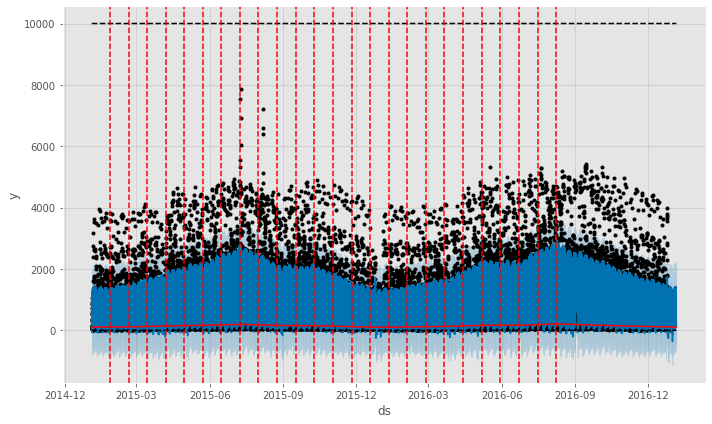

In [638]:
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

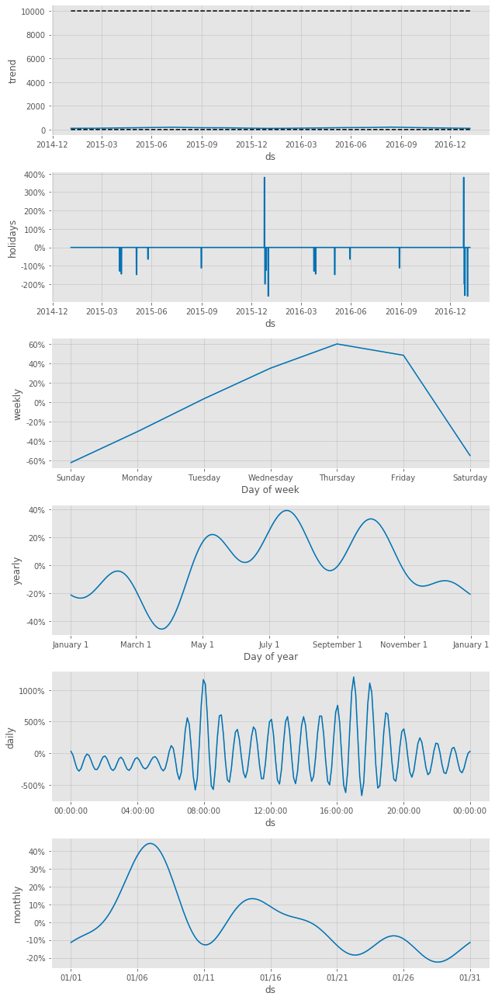

In [639]:
m.plot_components(forecast);

In [640]:
from fbprophet.plot import plot_plotly
import plotly.offline as py

py.init_notebook_mode()

fig = plot_plotly(m, forecast)  
py.iplot(fig)

In [641]:
# create a df with y and yhat values 
cmp_df = pd.merge(forecast, df, on='ds', how='outer')[['ds','yhat', 'yhat_lower','yhat_upper', 'y']].set_index('ds')

In [642]:
test_df = cmp_df[-prediction_size:]
y_true, y_pred = np.array(test_df['y']), np.array(test_df['yhat'])

y_true, y_pred

(array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]),
 array([ 158.38869771,  111.42721265,   76.96377085,   54.37210749,
          42.61572008,   59.8775714 ,  230.85192947,  709.23900088,
        1376.05749103,  794.99663936,  522.19204088,  569.34128109,
         708.95377685,  749.34334859,  740.00957287,  791.47682973,
         944.50379791, 1413.46936164, 1325.58651006,  856.04225203,
         571.01201673,  416.13210675,  344.14022981,  270.90423592,
         199.36661573,  156.3608094 ,  125.07681791,  104.80597085,
          94.46035229,  112.11258148,  281.88152294,  756.78703736,
        1418.46548802,  837.38338831,  562.54044131,  605.7070242 ,
         740.59080878,  776.54318269,  762.97839914,  810.04577504,
         958.44268442, 1421.66199424

Points to note:

- note when you remove all seasonality the floor value will be no lower than 0, however when you add seasonality it can go lower
- note you can only add regressors for which you know the past and future values for (although you could forecast the future values too). This makes it hard to use regressors like wind speed as they will be hard to predict in the future. Note that I tried the model with those other regressors too and the performance was worse. 
- Should create a train, holdout and test set to ensure overfitting isn't happening. 
- Could try speeding up some computation with multi-processing/multi-threading. 
- Could try changing the value of bayesian sampling (MCMC), however note that the computational time will increase. 

## Sources:
    
https://facebook.github.io/prophet/docs/quick_start.html
https://towardsdatascience.com/time-series-forecasting-with-prophet-54f2ac5e722e
https://towardsdatascience.com/implementing-facebook-prophet-efficiently-c241305405a3
https://towardsdatascience.com/forecasting-in-python-with-facebook-prophet-29810eb57e66